In [6]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama
import pandas as pd
from matplotlib import rcParams
from harmony import harmonize
from sklearn.utils import shuffle

import warnings

warnings.filterwarnings('ignore')

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


# DR and DL

In [102]:
P28dr_gaba = sc.read_h5ad('P28_dr_gaba.h5ad')
P38dr_gaba = sc.read_h5ad('P38_dr_gaba.h5ad')
P28dl_gaba = sc.read_h5ad('P28_dl_gaba.h5ad')

In [107]:
DRDL = P28dr_gaba.concatenate(P38dr_gaba, P28dl_gaba, batch_categories=['P28_DR', 'P38_DR', 
                                                                       'P28_DL'])

In [111]:
DRDL

AnnData object with n_obs × n_vars = 8082 × 19650
    obs: 'n_genes', 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'sample'
    var: 'gene_ids', 'feature_types', 'highly_variable-P28_DL', 'means-P28_DL', 'dispersions-P28_DL', 'dispersions_norm-P28_DL', 'mean-P28_DL', 'std-P28_DL', 'n_cells-P28_dl_1a-P28_DL', 'n_cells-P28_dl_1b-P28_DL', 'n_cells-P28_dl_2a-P28_DL', 'n_cells-P28_dl_2b-P28_DL', 'n_cells-P28_dr_1a-P28_DR', 'n_cells-P28_dr_1b-P28_DR', 'n_cells-P28_dr_3a-P28_DR', 'n_cells-P28_dr_3b-P28_DR', 'highly_variable-P28_DR', 'means-P28_DR', 'dispersions-P28_DR', 'dispersions_norm-P28_DR', 'mean-P28_DR', 'std-P28_DR', 'highly_variable-P38_DR', 'means-P38_DR', 'dispersions-P38_DR', 'dispersions_norm-P38_DR', 'mean-P38_DR', 'std-P38_DR', 'n_cells-P38_dr_1a-P38_DR', 'n_cells-P38_dr_1b-P38_DR', 'n_cells-P38_dr_2a-P38_DR', 'n_cells-P38_dr_2b-P38_DR'
    obsm: 'X_pca', 'X_umap'

In [113]:
DRDL.X = DRDL.raw.X
for i in ['highly_variable-P28_DL', 'means-P28_DL', 'dispersions-P28_DL', 'dispersions_norm-P28_DL', 'mean-P28_DL', 'std-P28_DL', 'n_cells-P28_dl_1a-P28_DL', 'n_cells-P28_dl_1b-P28_DL', 'n_cells-P28_dl_2a-P28_DL', 'n_cells-P28_dl_2b-P28_DL', 'n_cells-P28_dr_1a-P28_DR', 'n_cells-P28_dr_1b-P28_DR', 'n_cells-P28_dr_3a-P28_DR', 'n_cells-P28_dr_3b-P28_DR', 'highly_variable-P28_DR', 'means-P28_DR', 'dispersions-P28_DR', 'dispersions_norm-P28_DR', 'mean-P28_DR', 'std-P28_DR', 'highly_variable-P38_DR', 'means-P38_DR', 'dispersions-P38_DR', 'dispersions_norm-P38_DR', 'mean-P38_DR', 'std-P38_DR', 'n_cells-P38_dr_1a-P38_DR', 'n_cells-P38_dr_1b-P38_DR', 'n_cells-P38_dr_2a-P38_DR', 'n_cells-P38_dr_2b-P38_DR']:
    del DRDL.var[i]
del DRDL.obsm

In [124]:
DRDL.X

<8082x19650 sparse matrix of type '<class 'numpy.float32'>'
	with 28593084 stored elements in Compressed Sparse Row format>

In [147]:
P28dr_gaba = gaba_pipeline(DRDL[DRDL.obs.batch=='P28_DR',:])
P38dr_gaba = gaba_pipeline(DRDL[DRDL.obs.batch=='P38_DR',:])
P28dl_gaba = gaba_pipeline(DRDL[DRDL.obs.batch=='P28_DL',:])

extracting highly variable genes
    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
comput

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
Storing dendr

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.ob

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [148]:
print(P28dr_gaba.shape[0], P38dr_gaba.shape[0], P28dl_gaba.shape[0])

2589 2512 2981


## P28_DR

Discard b/c don't express any marker clearly and/or have high doublet score despite not being called doublets

20, 19, 13, 18, 17

In [150]:
P28dr_gaba = P28dr_gaba[P28dr_gaba.obs.leiden!='20',:]
P28dr_gaba = P28dr_gaba[P28dr_gaba.obs.leiden!='19',:]
P28dr_gaba = P28dr_gaba[P28dr_gaba.obs.leiden!='13',:]
P28dr_gaba = P28dr_gaba[P28dr_gaba.obs.leiden!='18',:]
P28dr_gaba = P28dr_gaba[P28dr_gaba.obs.leiden!='17',:]

In [151]:
P28dr_gaba.shape

(2376, 19650)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical


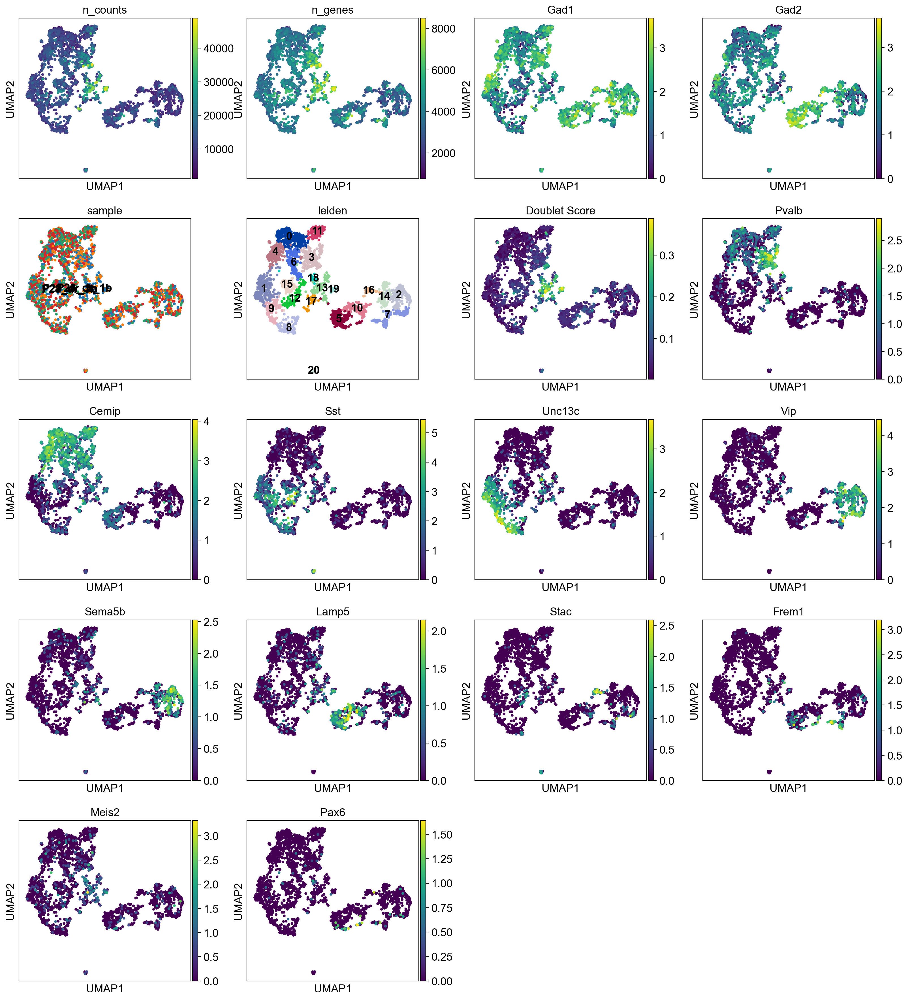

In [149]:
sc.pl.umap(P28dr_gaba, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

In [155]:
P28dr_gaba.X = P28dr_gaba.raw.X.A

P28dr_gaba_new = gaba_pipeline(P28dr_gaba)

extracting highly variable genes
    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


Read in to refine

In [130]:

P28dr_gaba_new = sc.read_h5ad(path_out+'P28dr_gaba_March2021.h5ad')

In [118]:
P28dr_gaba_new[P28dr_gaba_new.obs.leiden=='2',:].obs['sample'].value_counts(normalize=True)

P28_dr_1b    0.437811
P28_dr_1a    0.373134
P28_dr_3b    0.094527
P28_dr_3a    0.094527
Name: sample, dtype: float64

In [119]:
P28dr_gaba_new.obs['sample'].value_counts(normalize=True)

P28_dr_3b    0.334596
P28_dr_3a    0.310185
P28_dr_1b    0.188552
P28_dr_1a    0.166667
Name: sample, dtype: float64

In [120]:
def DE(adata, obs_id, obs_id_test, ref):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                            reference=ref, method='wilcoxon', n_genes=100)

    wilcLF = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes_s = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF_s = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF_s.sort() #log fold changes from lowest to highest
    wilcGenes = [] #list of genes ordered by logfold change: low to high

    for i in wilcLF_s:
        gene_idx = np.where(wilcLF == i)[0][0]
        wilcGenes.append(wilcGenes_s[gene_idx])

    wilcGenes_correct = []
    for i in reversed(wilcGenes):
        wilcGenes_correct.append(i) # #list of genes ordered by logfold change high to low
        
    return wilcGenes_correct
    

In [121]:
DE(P28dr_gaba_new, obs_id='leiden', obs_id_test='2', ref='rest')[0:10]

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


['Pvalb',
 'Chchd10',
 'Cend1',
 'Tmsb4x',
 'Gm10039',
 'Pgam1',
 'Atp5g3',
 'Pcsk1n',
 'Rab3a',
 'Slc25a5']

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


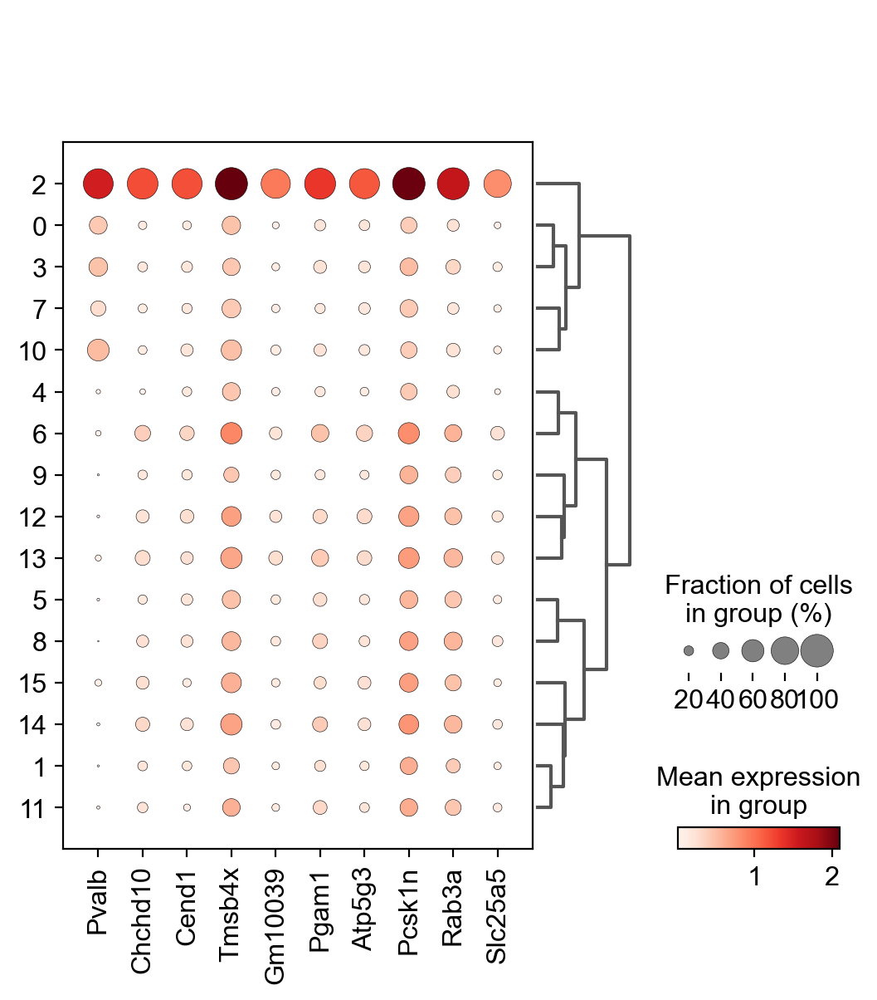

In [122]:
sc.pl.dotplot(P28dr_gaba_new, var_names=['Pvalb',
 'Chchd10',
 'Cend1',
 'Tmsb4x',
 'Gm10039',
 'Pgam1',
 'Atp5g3',
 'Pcsk1n',
 'Rab3a',
 'Slc25a5'], groupby='leiden', dendrogram=True)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


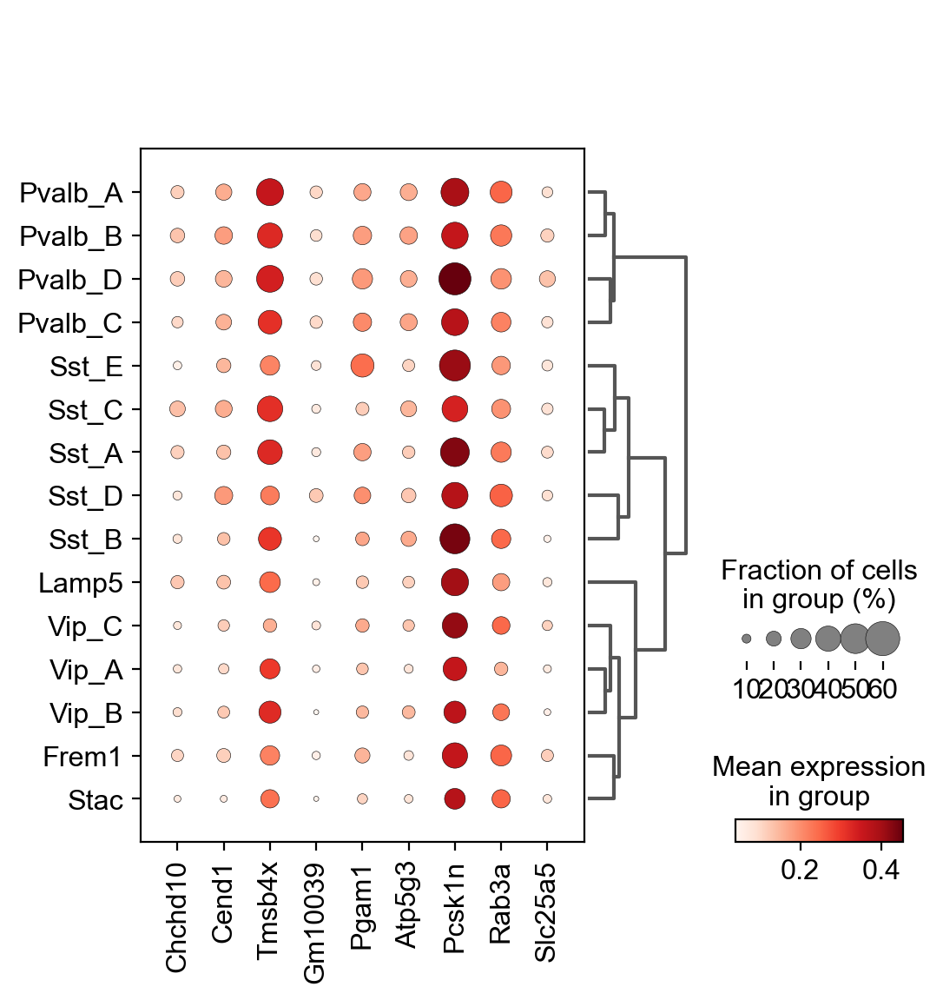

In [124]:
sc.pl.dotplot(P28_gaba, var_names=[
 'Chchd10',
 'Cend1',
 'Tmsb4x',
 'Gm10039',
 'Pgam1',
 'Atp5g3',
 'Pcsk1n',
 'Rab3a',
 'Slc25a5'], groupby='Type', dendrogram=True)

In [133]:
#remove C2 b/c batch-specific and extra
P28dr_gaba_new = P28dr_gaba_new[P28dr_gaba_new.obs.leiden!='2',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [135]:
sc.tl.leiden(P28dr_gaba_new)

running Leiden clustering


Trying to set attribute `.obs` of view, copying.


    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


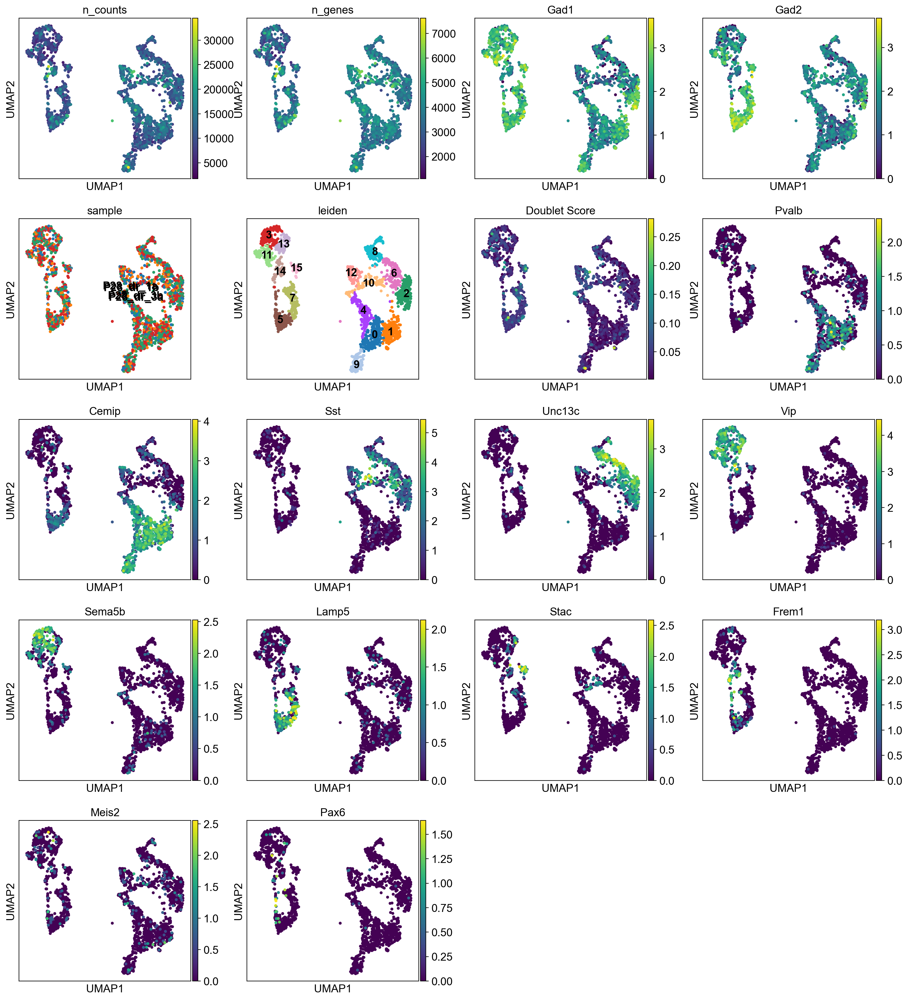

In [136]:
sc.pl.umap(P28dr_gaba_new, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

Will need to merge the PV 5 to become 4 after mapping NR to it. 

In [138]:
sc.tl.dendrogram(P28dr_gaba_new, groupby='leiden', use_rep='X_harmony')

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


In [15]:
bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Frem1',
                'Stac',
                'Cpne5',
                ]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


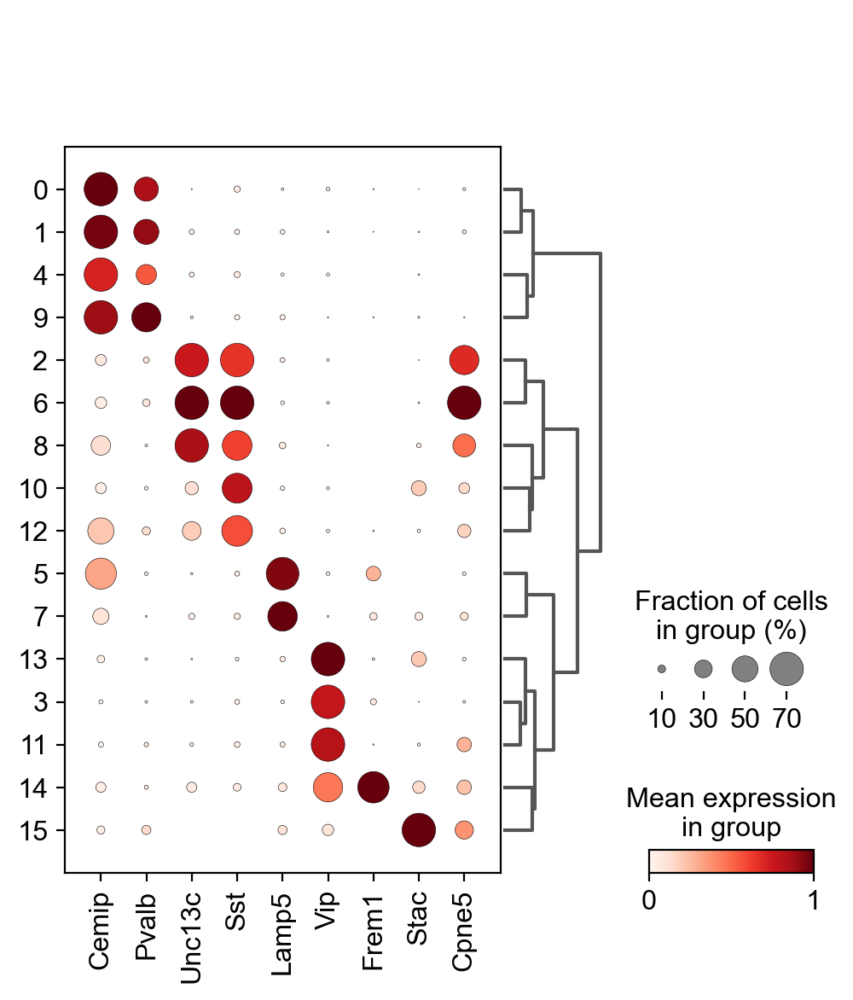

In [140]:
layer_markers = ['Slc17a7',
    'Cux2', 'Ccbe1', 'Mdga1', 
              'Whrn', 'Rorb',
              'Deptor', 
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8', 
              'Bcl6', 'Erg', 'Reln', 
              'Cdh9', 'Zfp804b',
              'Foxp2', 'Syt6',
              'Ctgf', 'Inpp4b', 'Svil']

bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Frem1',
                'Stac',
                'Cpne5',
                ]

sc.pl.dotplot(P28dr_gaba_new, bias_markers, groupby='leiden', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)
#sc.pl.dotplot(P28_gaba, layer_markers, groupby='cluster_name', dendrogram=True)

In [141]:
P28dr_gaba_new.obs.leiden.values.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15'],
      dtype='object')

In [8]:
P28dr_gaba_new.obs.leiden.values.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15'],
      dtype='object')

In [21]:
Type = ['Pvalb_A', 'Pvalb_B', 'Sst_A', 'Vip_A', 'Pvalb_D', 'Lamp5_1', 'Sst_C', 'Lamp5_2', 'Sst_B', 
        'Pvalb_C', 'Sst_E', 'Vip_B', 'Sst_D',
       'Vip_C', 'Frem1', 'Stac'] 

P28dr_gaba_new.obs['Type'] = P28dr_gaba_new.obs['leiden']
a = P28dr_gaba_new.obs['Type']
P28dr_gaba_new.obs['Type'] = a.cat.rename_categories(Type).values

In [22]:
types_P28DR = []
for i in range(P28dr_gaba_new.shape[0]):
    if (P28dr_gaba_new.obs.Type[i] in ['Lamp5_1', 'Lamp5_2']):
        types_P28DR.append(P28dr_gaba_new.obs.Type[i].split('_')[0])
        
    else: types_P28DR.append(P28dr_gaba_new.obs.Type[i])
    

In [23]:
P28dr_gaba_new.obs['Type'] = pd.Categorical(types_P28DR)

In [24]:
sc.tl.dendrogram(P28dr_gaba_new, groupby='Type', use_rep='X_harmony')

Storing dendrogram info using `.uns["dendrogram_['Type']"]`


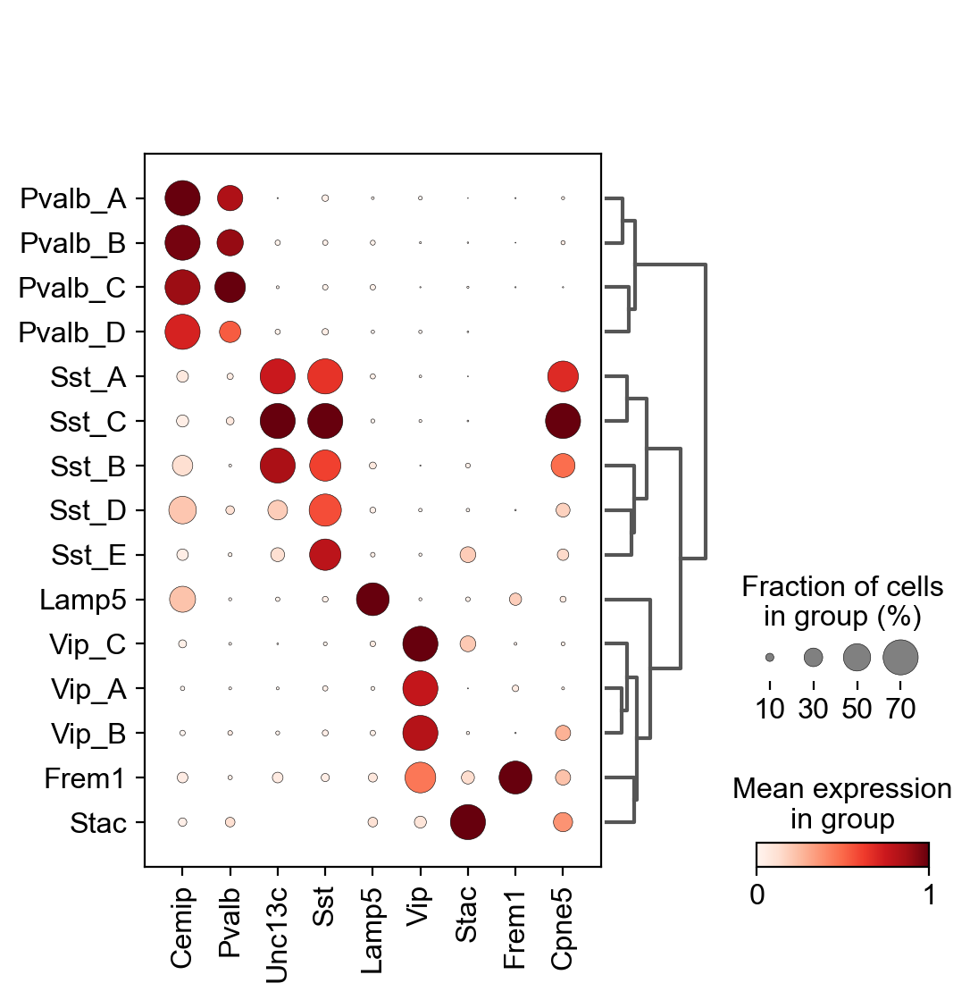

In [25]:
sc.pl.dotplot(P28dr_gaba_new, bias_markers, groupby='Type', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)

## P38_DR

Discard b/c don't express any marker clearly and/or have high doublet score despite not being called doublets

18, 12, 16, 17

In [163]:
P38dr_gaba = P38dr_gaba[P38dr_gaba.obs.leiden!='18',:]
P38dr_gaba = P38dr_gaba[P38dr_gaba.obs.leiden!='12',:]
P38dr_gaba = P38dr_gaba[P38dr_gaba.obs.leiden!='16',:]
P38dr_gaba = P38dr_gaba[P38dr_gaba.obs.leiden!='17',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical


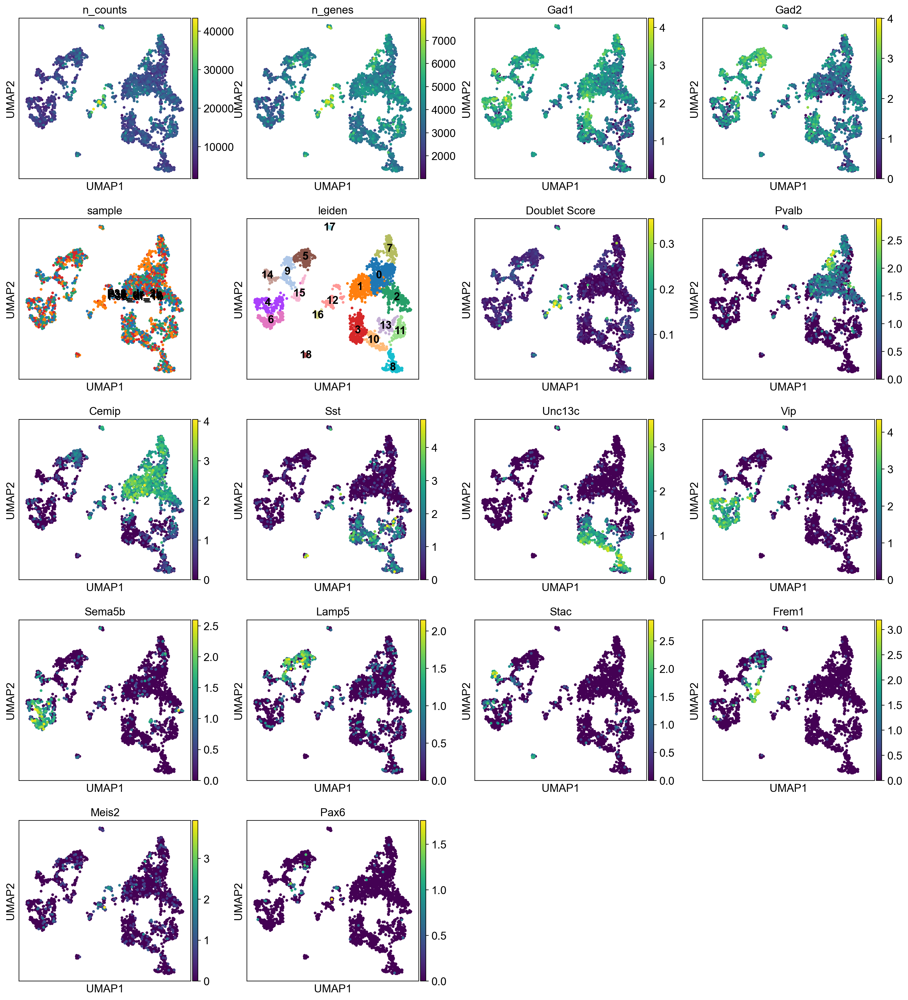

In [160]:
sc.pl.umap(P38dr_gaba, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

In [164]:
P38dr_gaba.X = P38dr_gaba.raw.X.A

P38dr_gaba_new = gaba_pipeline(P38dr_gaba)

extracting highly variable genes
    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
co

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
Trying to set attribute `.uns` of view, copying.


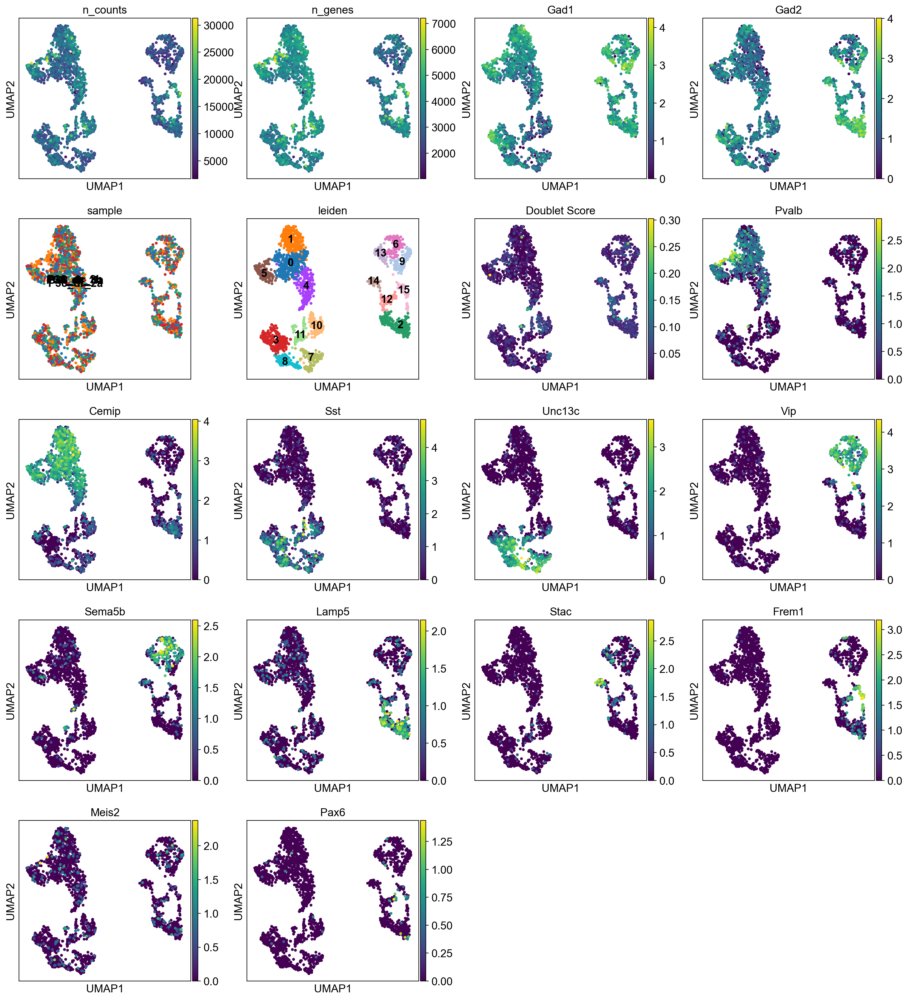

In [165]:
sc.pl.umap(P38dr_gaba_new, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


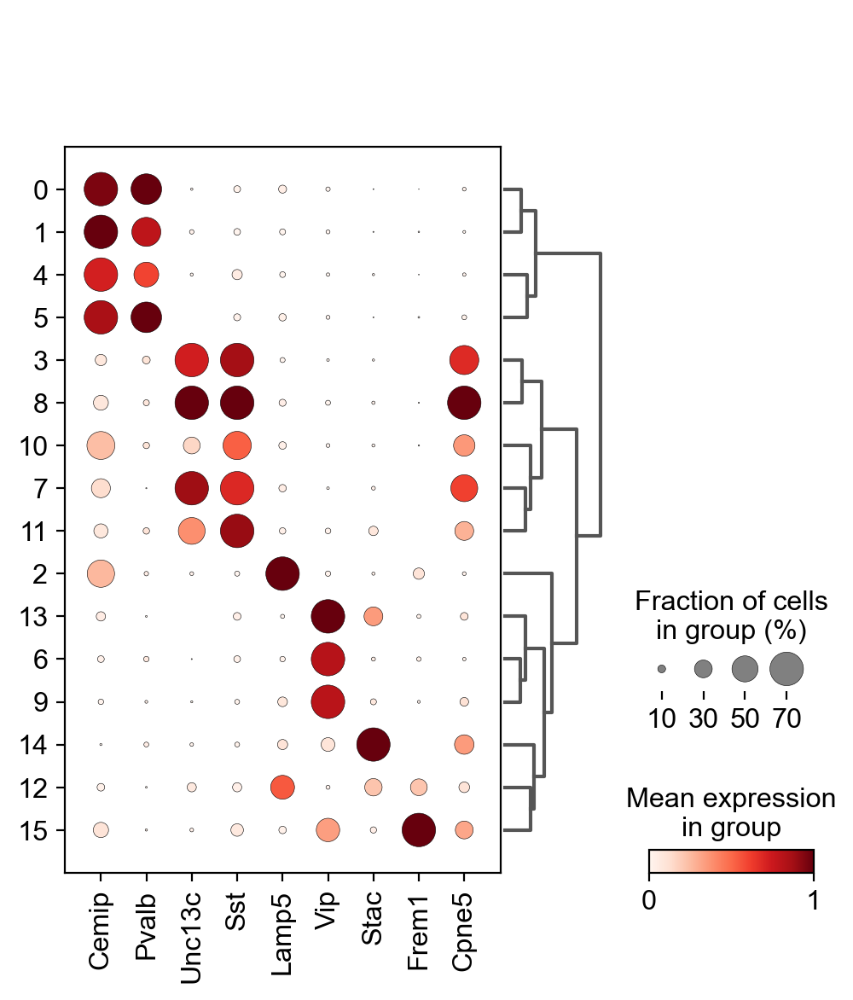

In [147]:
layer_markers = ['Slc17a7',
    'Cux2', 'Ccbe1', 'Mdga1', 
              'Whrn', 'Rorb',
              'Deptor', 
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8', 
              'Bcl6', 'Erg', 'Reln', 
              'Cdh9', 'Zfp804b',
              'Foxp2', 'Syt6',
              'Ctgf', 'Inpp4b', 'Svil']

bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Stac',
                'Frem1',
                'Cpne5',
                ]
        
sc.pl.dotplot(P38dr_gaba_new, bias_markers, groupby='leiden', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)
#sc.pl.dotplot(P28_gaba, layer_markers, groupby='cluster_name', dendrogram=True)

In [144]:
P38dr_gaba_new = sc.read_h5ad(path_out+'P38dr_gaba_March2021.h5ad')


In [9]:
P38dr_gaba_new.obs.leiden.values.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15'],
      dtype='object')

In [11]:
P38dr_gaba_new.obs.leiden.values.categories

Type = ['Pvalb_A', 'Pvalb_B', 'Lamp5_1', 'Sst_A', 'Pvalb_D', 'Pvalb_C', 'Vip_A', 'Sst_B', 
        'Sst_C', 'Vip_B', 'Sst_D', 'Sst_E', 'Lamp5_2',
       'Vip_C', 'Stac', 'Frem1' ] 

P38dr_gaba_new.obs['Type'] = P38dr_gaba_new.obs['leiden']
a = P38dr_gaba_new.obs['Type']
P38dr_gaba_new.obs['Type'] = a.cat.rename_categories(Type).values

In [12]:
types_P38DR = []
for i in range(P38dr_gaba_new.shape[0]):
    if (P38dr_gaba_new.obs.Type[i] in ['Lamp5_1', 'Lamp5_2']):
        types_P38DR.append(P38dr_gaba_new.obs.Type[i].split('_')[0])
        
    else: types_P38DR.append(P38dr_gaba_new.obs.Type[i])
    

P38dr_gaba_new.obs['Type'] = pd.Categorical(types_P38DR)


sc.tl.dendrogram(P38dr_gaba_new, groupby='Type', use_rep='X_harmony')

Storing dendrogram info using `.uns["dendrogram_['Type']"]`


In [14]:
bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Stac',
                'Frem1',
                'Cpne5',
                ]

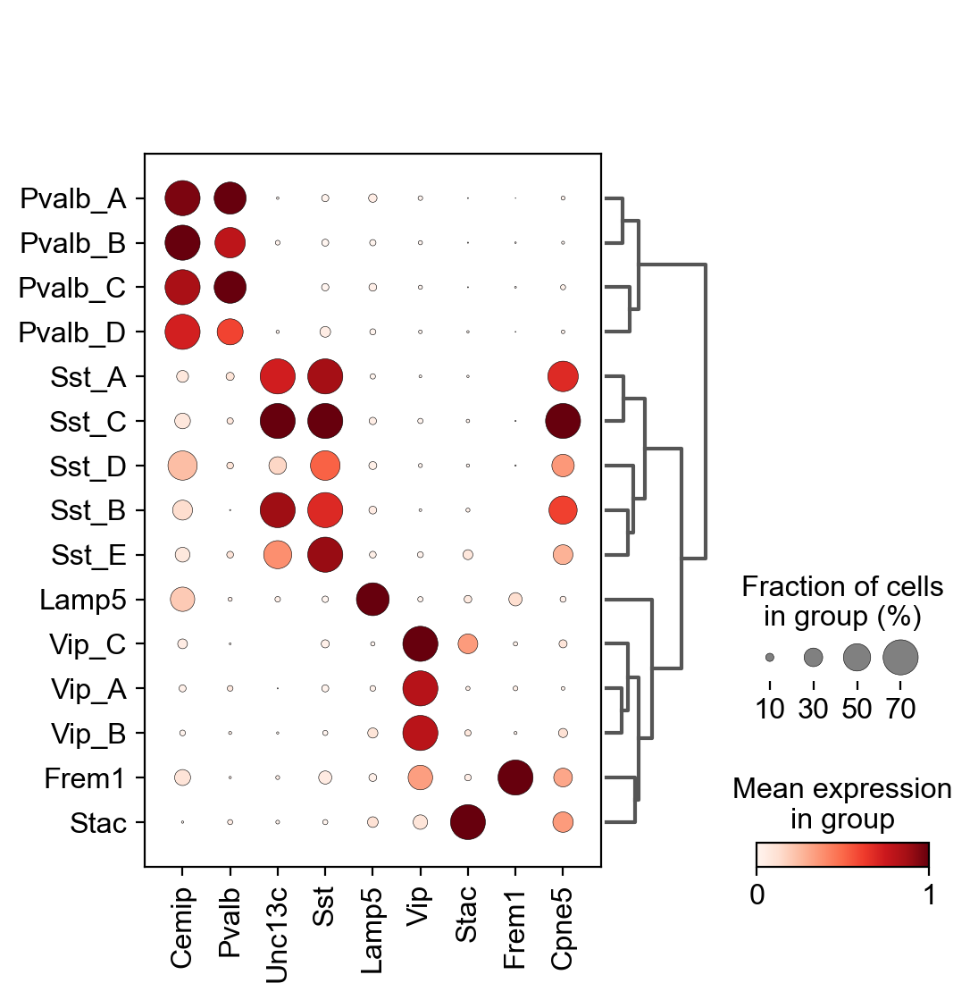

In [15]:
sc.pl.dotplot(P38dr_gaba_new, bias_markers, groupby='Type', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)

## P28_DL

Discard b/c don't express any marker clearly and/or have high doublet score despite not being called doublets

17, 19, 20, 21

In [53]:
P28dl_gaba = P28dl_gaba[P28dl_gaba.obs.leiden!='17',:]
P28dl_gaba = P28dl_gaba[P28dl_gaba.obs.leiden!='19',:]
P28dl_gaba = P28dl_gaba[P28dl_gaba.obs.leiden!='20',:]
P28dl_gaba = P28dl_gaba[P28dl_gaba.obs.leiden!='21',:]

NameError: name 'P28dl_gaba' is not defined

In [55]:
P28dl_gaba_new = sc.read_h5ad(path_out+'P28dl_gaba_March2021.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical


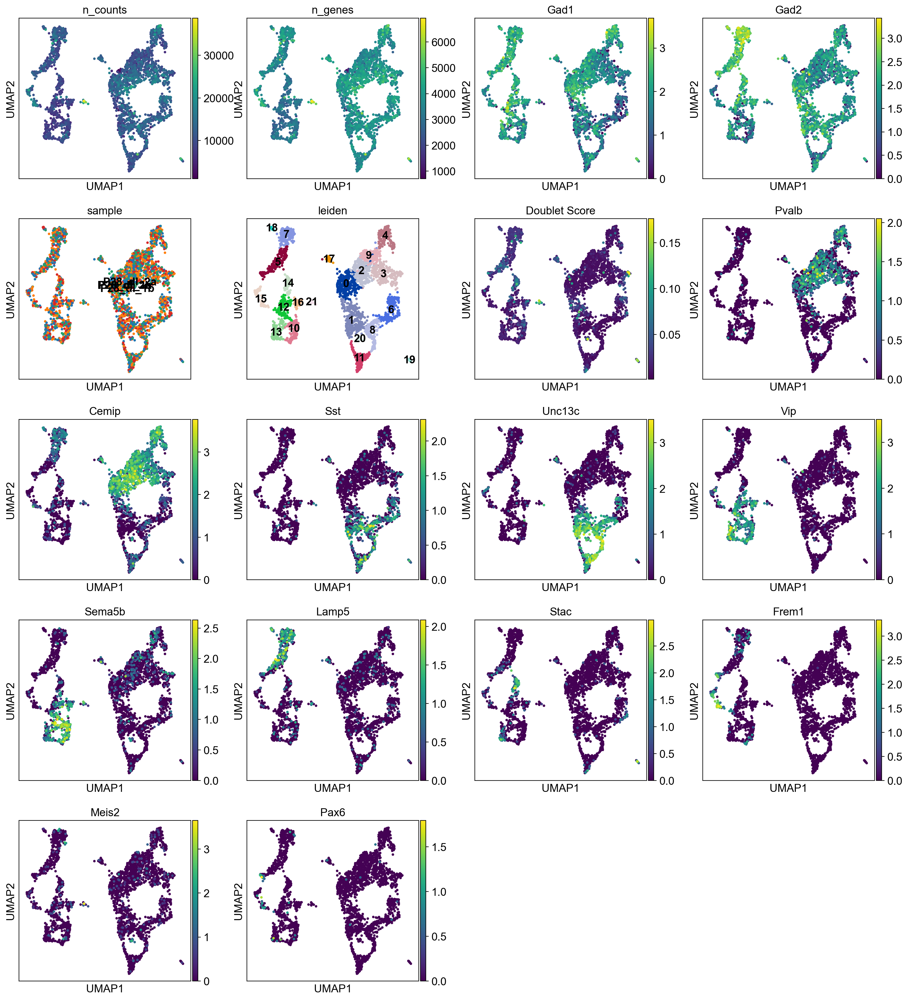

In [168]:
sc.pl.umap(P28dl_gaba, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

In [56]:
#after above removals
P28dl_gaba_new = P28dl_gaba_new[P28dl_gaba_new.obs.leiden!='17',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [61]:
#after above removal
P28dl_gaba_new = P28dl_gaba_new[P28dl_gaba_new.obs.leiden!='16',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [62]:
P28dl_gaba_new.X = P28dl_gaba_new.raw.X.A

P28dl_gaba_new = gaba_pipeline(P28dl_gaba_new)

extracting highly variable genes
    finished (0:00:00)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
Storing den

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [66]:
#to separate that Sst clust that's near PV
sc.tl.leiden(P28dl_gaba_new, resolution=1.1)

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


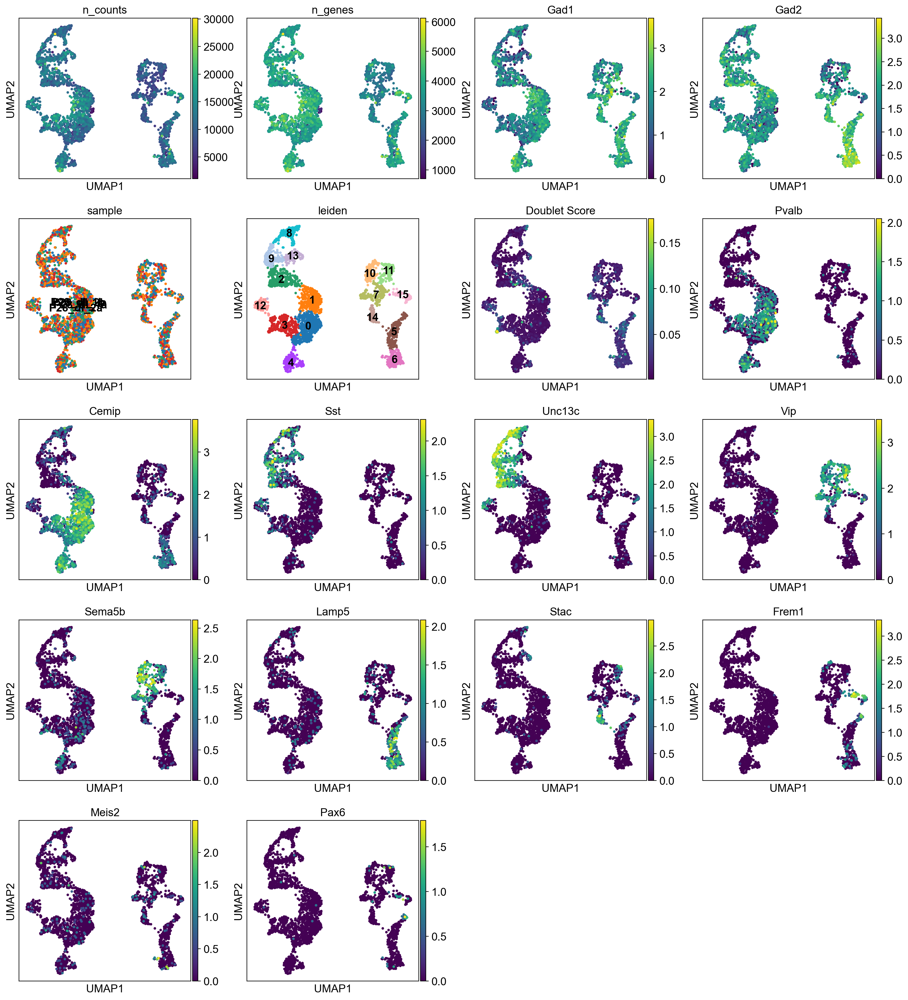

In [67]:
sc.pl.umap(P28dl_gaba_new, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 
                           'sample', 'leiden', 'Doublet Score',
                          'Pvalb', 'Cemip', 
                           'Sst', 'Unc13c',
                           'Vip', 'Sema5b', 
                           'Lamp5', 'Stac', 'Frem1', 
                           'Meis2', 'Pax6'], legend_loc='on data')

In [69]:
sc.tl.dendrogram(P28dl_gaba_new, groupby='leiden', use_rep='X_harmony')

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


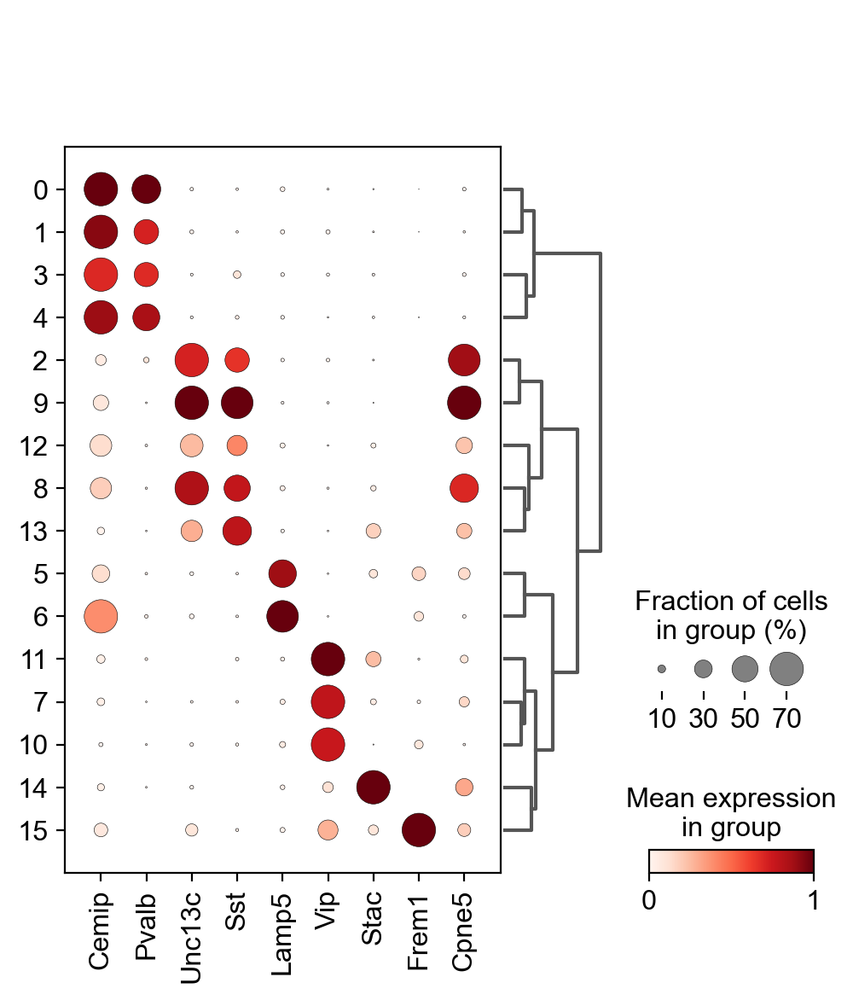

In [70]:
layer_markers = ['Slc17a7',
    'Cux2', 'Ccbe1', 'Mdga1', 
              'Whrn', 'Rorb',
              'Deptor', 
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8', 
              'Bcl6', 'Erg', 'Reln', 
              'Cdh9', 'Zfp804b',
              'Foxp2', 'Syt6',
              'Ctgf', 'Inpp4b', 'Svil']

bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Stac',
                'Frem1',
                'Cpne5',
                ]
        
sc.pl.dotplot(P28dl_gaba_new, bias_markers, groupby='leiden', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)
#sc.pl.dotplot(P28_gaba, layer_markers, groupby='cluster_name', dendrogram=True)

In [151]:
P28dl_gaba_new = sc.read_h5ad(path_out+'P28dl_gaba_March2021.h5ad')
P28dl_gaba_new.obs.leiden.values.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15'],
      dtype='object')

In [26]:
Type = ['Pvalb_A', 'Pvalb_B', 'Sst_A', 'Pvalb_D', 'Pvalb_C', 'Lamp5_1', 
        'Lamp5_2', 'Vip_B', 'Sst_B', 
        'Sst_C', 'Vip_A', 'Vip_C', 'Sst_D',
       'Sst_E', 'Stac', 'Frem1'] 

P28dl_gaba_new.obs['Type'] = P28dl_gaba_new.obs['leiden']
a = P28dl_gaba_new.obs['Type']
P28dl_gaba_new.obs['Type'] = a.cat.rename_categories(Type).values

In [27]:
types_P28dl = []
for i in range(P28dl_gaba_new.shape[0]):
    if (P28dl_gaba_new.obs.Type[i] in ['Lamp5_1', 'Lamp5_2']):
        types_P28dl.append(P28dl_gaba_new.obs.Type[i].split('_')[0])
        
    else: types_P28dl.append(P28dl_gaba_new.obs.Type[i])
    

P28dl_gaba_new.obs['Type'] = pd.Categorical(types_P28dl)


sc.tl.dendrogram(P28dl_gaba_new, groupby='Type', use_rep='X_harmony')

Storing dendrogram info using `.uns["dendrogram_['Type']"]`


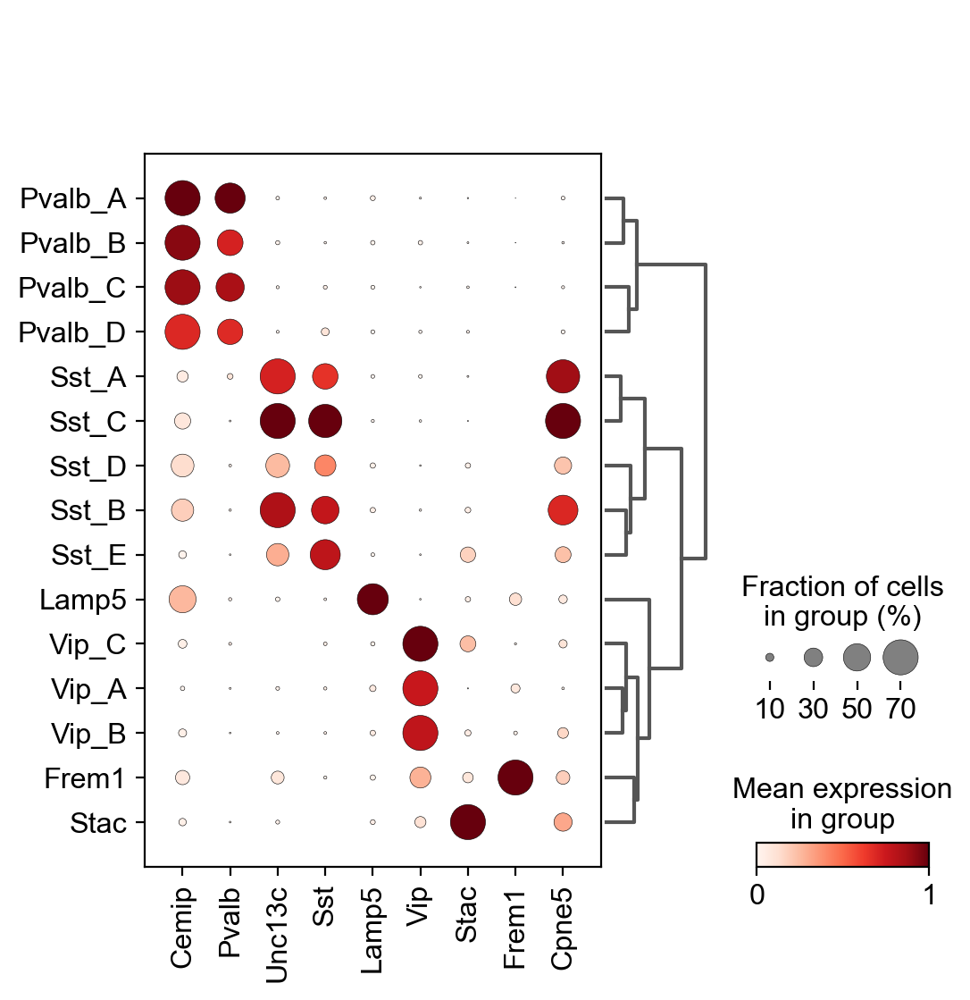

In [28]:
bias_markers = ['Cemip', 'Pvalb',
                'Unc13c', 'Sst',
                'Lamp5',
                'Vip',
                'Stac',
                'Frem1',
                'Cpne5',
                ]
        
sc.pl.dotplot(P28dl_gaba_new, bias_markers, groupby='Type', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)

## Write DR/DL for MCC

In [154]:
P28dr_gaba_new = name_subclass(P28dr_gaba_new)
P28dl_gaba_new = name_subclass(P28dl_gaba_new)
P38dr_gaba_new = name_subclass(P38dr_gaba_new)

In [31]:

P28dr_gaba_new.write_h5ad(path_out+'P28dr_gaba_March2021.h5ad')
P28dl_gaba_new.write_h5ad(path_out+'P28dl_gaba_March2021.h5ad')

P38dr_gaba_new.write_h5ad(path_out+'P38dr_gaba_March2021.h5ad')

